In [55]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
import scipy as sc
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
import time
import astropy
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.action_chains import ActionChains
from astropy.coordinates import SkyCoord
import astropy.units as u
import pickle

Retrieving information of downloaded spectra:

In [2]:
with open('spectra_info.pkl', 'rb') as file:
    info = pickle.load(file)
info.keys()

dict_keys(['names', 'flux_tot', 'loglam_tot', 'lam_tot', 'ivar_tot', 'std_dev_tot', 'rest_lam_tot', 'redshifts', 'n_hs', 'flux_norm_tot', 'ivar_norm_tot', 'std_dev_norm_tot'])

In [65]:
names = info['names']
lam_tot = info['lam_tot']
flux_tot = info['flux_tot']
ivar_tot = info['ivar_tot']
std_dev_tot = info['std_dev_tot']
rest_lam_tot = info['rest_lam_tot']
redshifts = info['redshifts']
n_hs = info['n_hs']
flux_norm_tot = info['flux_norm_tot']
ivar_norm_tot = info['ivar_norm_tot']
std_dev_norm_tot = info['std_dev_norm_tot']

Webscraping function to extract emission lines from sdss table:

In [58]:
driver = webdriver.Safari()
url = 'https://classic.sdss.org/dr6/algorithms/linestable.php'
driver.get(url)
driver.maximize_window()
em_line_wavelength = []
em_line_type = []

table = driver.find_element(By.TAG_NAME, 'table')

rows = table.find_elements(By.TAG_NAME, 'tr')

for row in rows[3:]:
    cells=  row.find_elements(By.TAG_NAME, 'td')
    if len(cells) !=4:
        break
    wave = row.find_element(By.XPATH, 'td[1]')
    wavelength = wave.text.strip()
    em_line_wavelength.append(float(wavelength))
    ty = row.find_element(By.XPATH, 'td[4]')
    typee = ty.text.strip()
    em_line_type.append(typee)
driver.quit()

Retrieving information of outlier spectra:

In [56]:
import pickle
with open('outlier_spectra_info.pkl', 'rb') as file:
    outlier_info = pickle.load(file)

In [57]:
names_outlier = outlier_info['names_outlier']
lam_outlier_tot = outlier_info['lam_outlier_tot']
flux_outlier_tot = outlier_info['flux_outlier_tot']
outlier_eFEDS_redshifts = outlier_info['outlier_eFEDS_redshifts']
outlier_SDSS_redshifts = outlier_info['outlier_SDSS_redshifts']

Plotting some outlier spectra:

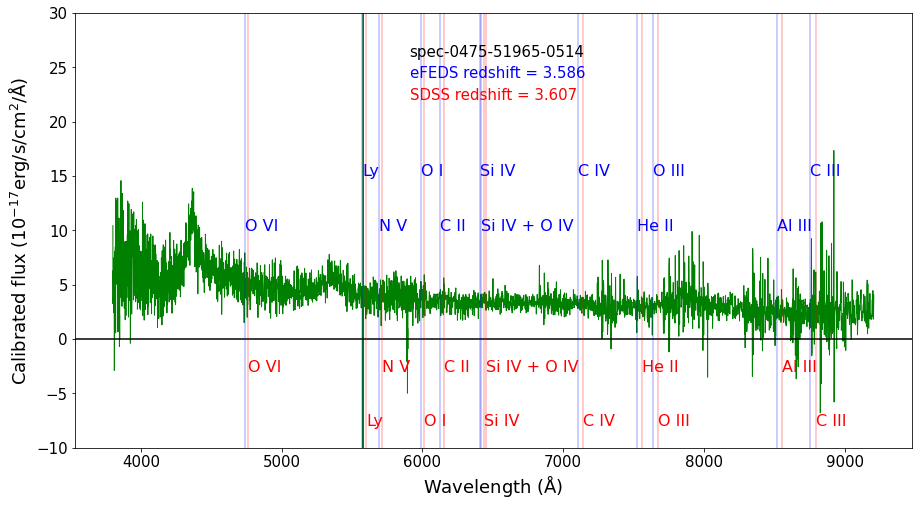

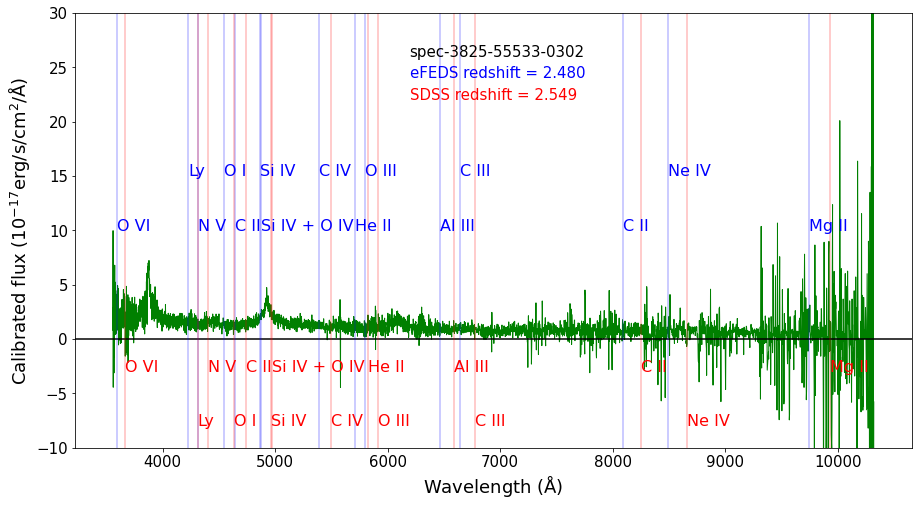

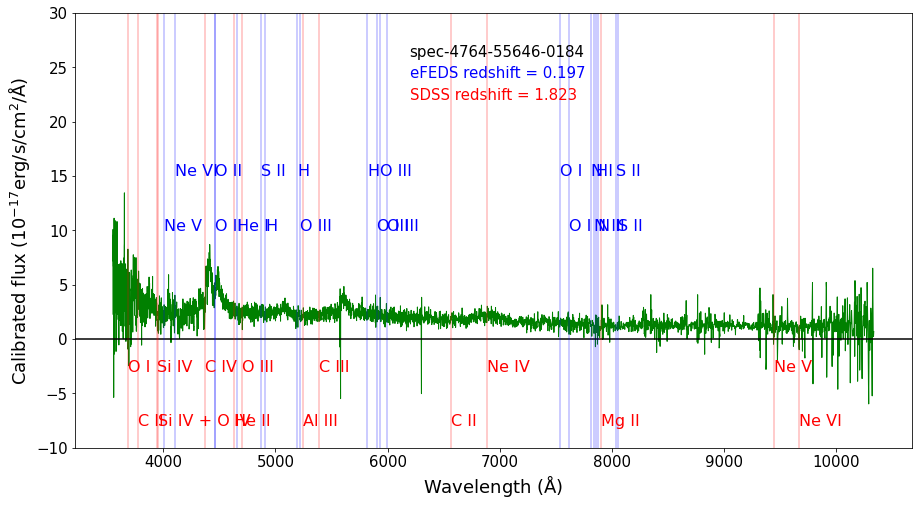

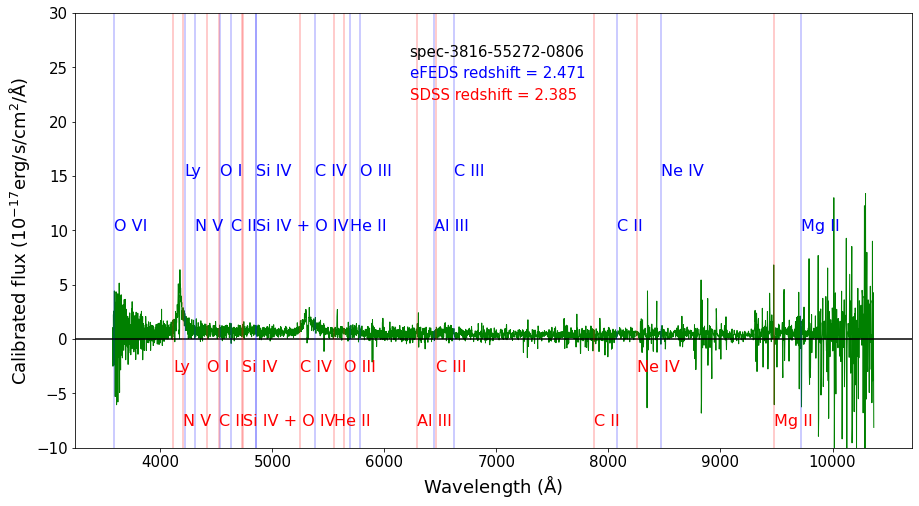

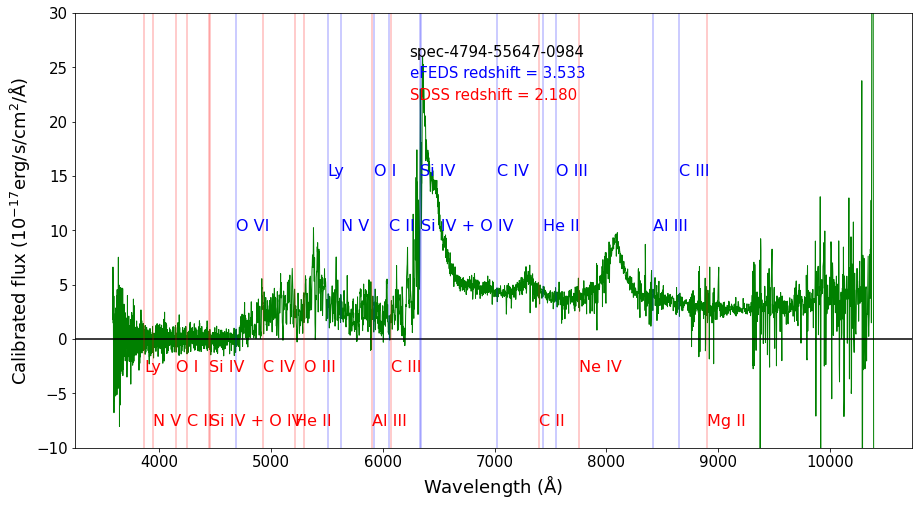

...

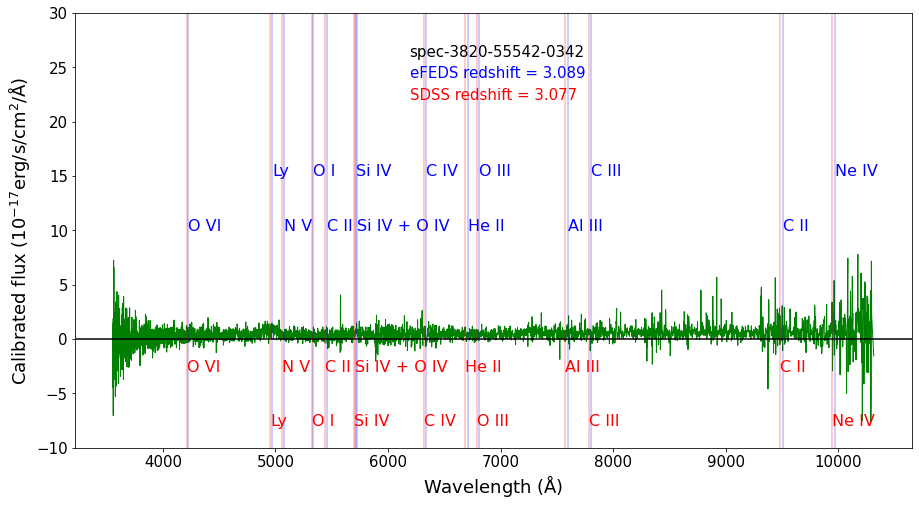

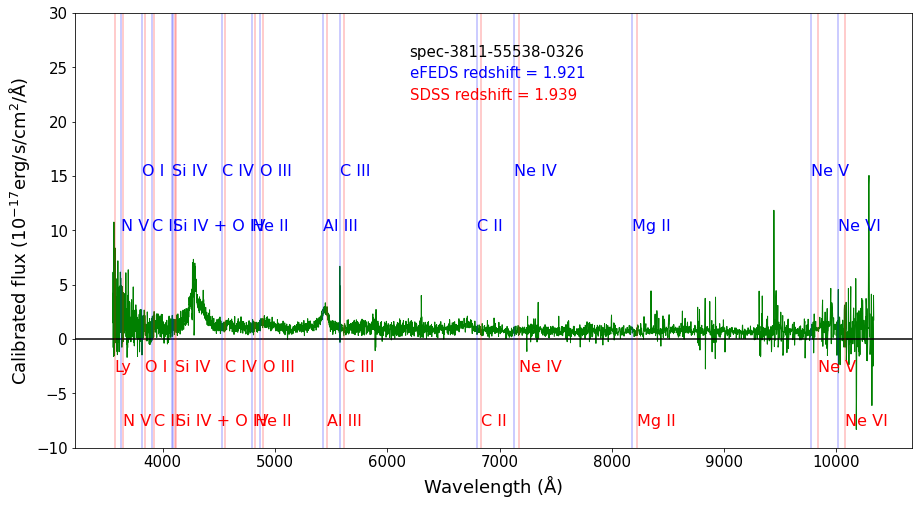

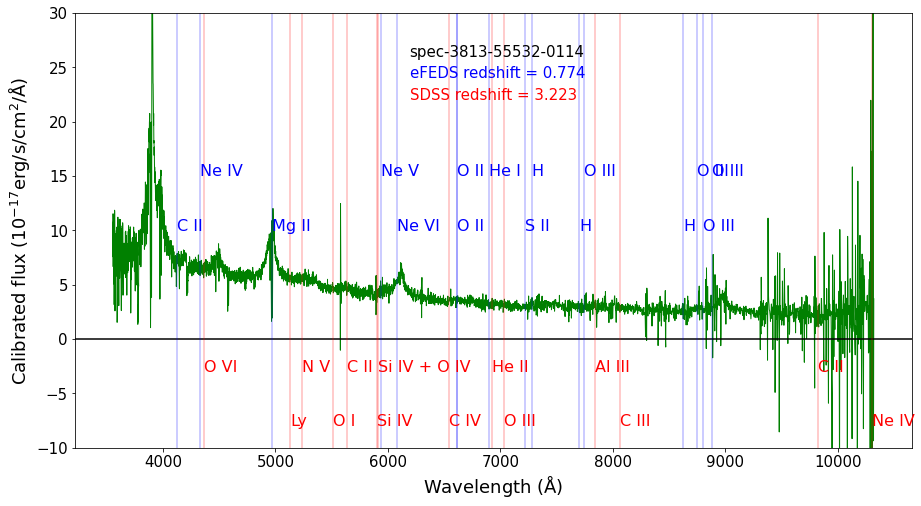

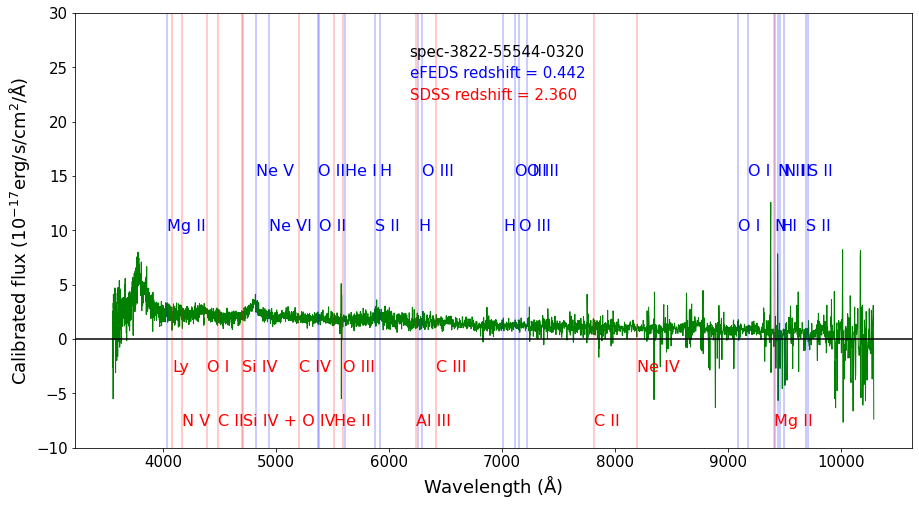

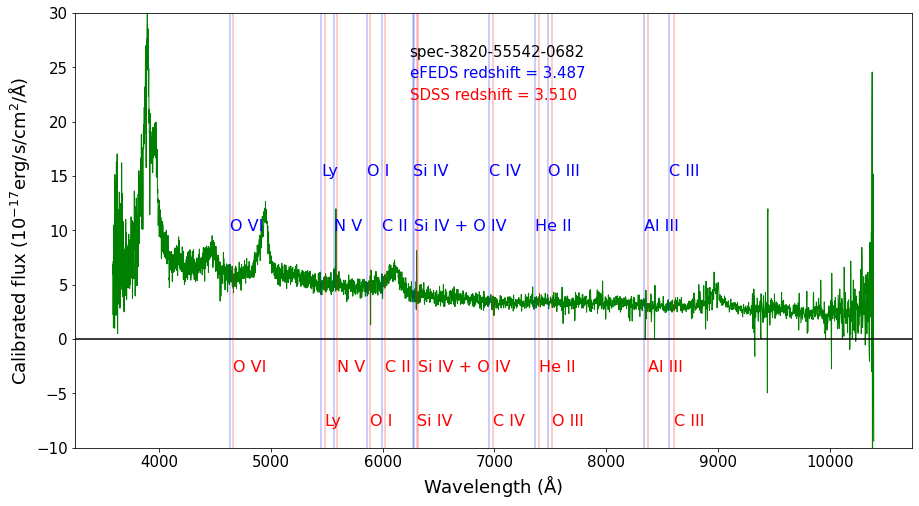

In [70]:
for i in range(len(names_outlier)):
    fig, ax = plt.subplots(1,1, figsize=(15,8))
    ax.plot(lam_outlier_tot[i], flux_outlier_tot[i], color='green', lw=1)
    ax.text(0.4,0.9, names_outlier[i], transform=ax.transAxes, fontsize=15, color='black')
    ax.text(0.4, 0.85, f'eFEDS redshift = {outlier_eFEDS_redshifts[i]:.3f}', transform=ax.transAxes, fontsize=15, color='blue')
    ax.text(0.4, 0.8, f'SDSS redshift = {outlier_SDSS_redshifts[i]:.3f}', transform=ax.transAxes, fontsize=15, color='red')
    ax.tick_params(axis='both', labelsize=(15))
    ax.tick_params(axis='both', labelsize=(15))
    ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=18)
    ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=18)
    ax.axhline(0, color='black')
    ax.set_ylim(-10,30)
    
    r=0
    for s in range(len(em_line_wavelength)):
        if (em_line_wavelength[s]*(1+outlier_eFEDS_redshifts[i]) >= lam_outlier_tot[i][0]) & (em_line_wavelength[s]*(1+outlier_eFEDS_redshifts[i]) <= lam_outlier_tot[i][-1]):
            r+=1
            ax.axvline(em_line_wavelength[s]*(1+outlier_eFEDS_redshifts[i]), color='blue', lw=0.4)
            if r%2==0:
                ax.text(em_line_wavelength[s]*(1+outlier_eFEDS_redshifts[i]), 15, em_line_type[s], color='blue', fontsize=16)
            else:
                ax.text(em_line_wavelength[s]*(1+outlier_eFEDS_redshifts[i]), 10, em_line_type[s], color='blue', fontsize=16)
    r=0
    for s in range(len(em_line_wavelength)):
        if (em_line_wavelength[s]*(1+outlier_SDSS_redshifts[i]) >= lam_outlier_tot[i][0]) & (em_line_wavelength[s]*(1+outlier_SDSS_redshifts[i]) <= lam_outlier_tot[i][-1]):
            r+=1
            ax.axvline(em_line_wavelength[s]*(1+outlier_SDSS_redshifts[i]), color='red', lw=0.4)
            if r%2==0:
                ax.text(em_line_wavelength[s]*(1+outlier_SDSS_redshifts[i]), -8, em_line_type[s], color='red', fontsize=16)
            else:
                ax.text(em_line_wavelength[s]*(1+outlier_SDSS_redshifts[i]), -3, em_line_type[s], color='red', fontsize=16)
    plt.show()
    plt.close(fig)

Plotting individual spectra without rest-frame correction based on spectra plate, mjd and fiber id:

(-10.0, 458.2953598022461)

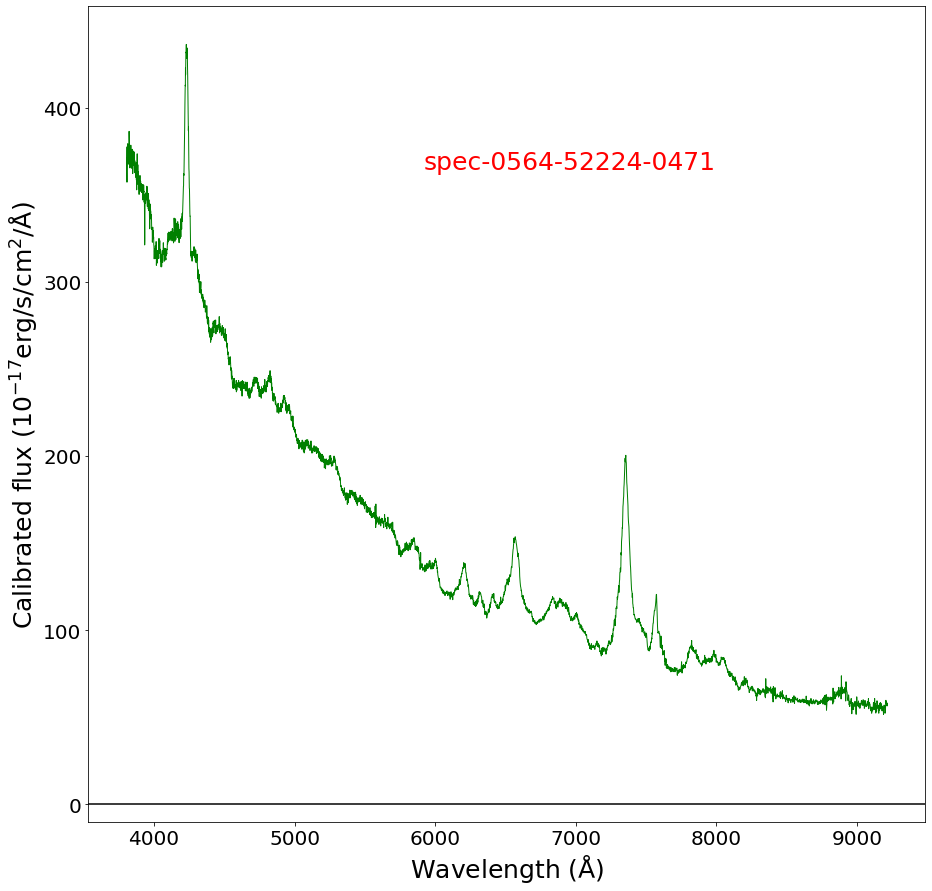

In [6]:
name = int(np.where(names=='spec-0564-52224-0471')[0])
fig, ax = plt.subplots(figsize=(15,15))
ax.plot(lam_tot[name], flux_tot[name], lw=1, color='green')
ax.text(0.4,0.80, names[name], transform=ax.transAxes, fontsize=25, color='red')
ax.tick_params(axis='both', labelsize=(20))
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=25)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=25)
ax.axhline(0, color='black')
ax.set_ylim(-10)
#ax.axvline(9319)

Plotting individual spectra now rest-frame corrected:

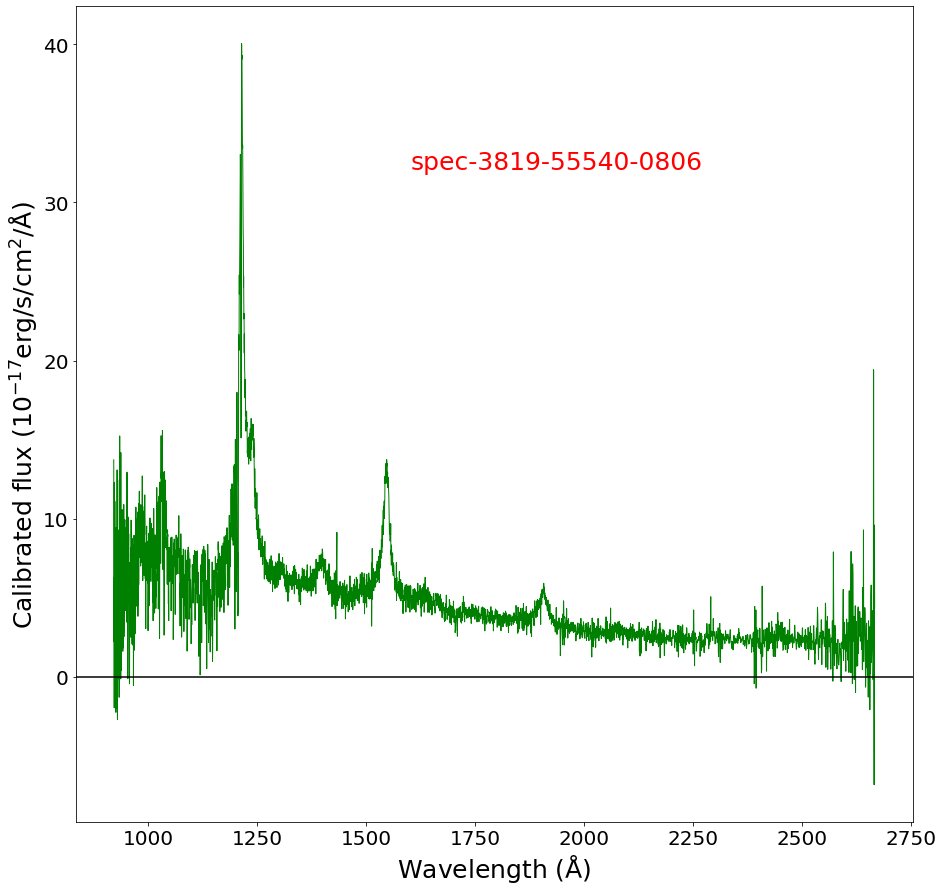

In [7]:
name = int(np.where(names=='spec-3819-55540-0806')[0])
fig, ax = plt.subplots(figsize=(15,15))
ax.plot(rest_lam_tot[name], flux_tot[name], lw=1, color='green')
ax.text(0.4,0.80, names[name], transform=ax.transAxes, fontsize=25, color='red')
ax.tick_params(axis='both', labelsize=(20))
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=25)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=25)
ax.axhline(0, color='black')

Same plot now with standard deviation in flux added:

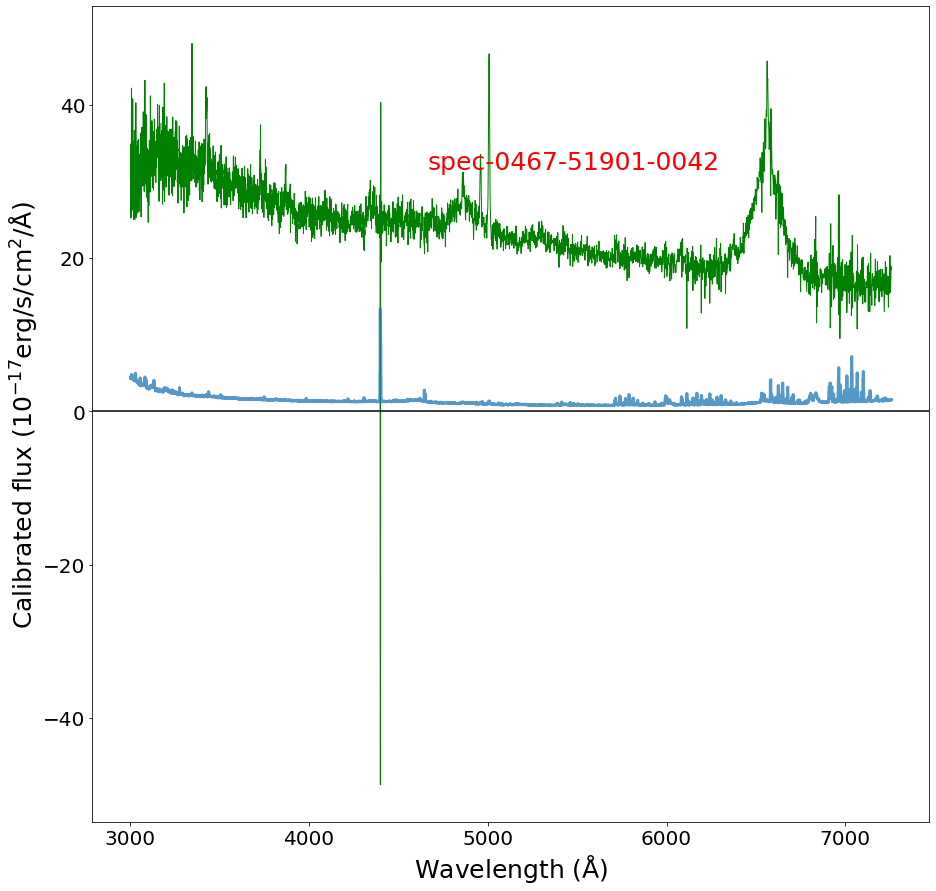

In [8]:
name = int(np.where(names=='spec-0467-51901-0042')[0])
fig, ax = plt.subplots(figsize=(15,15))
ax.plot(rest_lam_tot[name], flux_tot[name], lw=1, color='green')
ax.plot(rest_lam_tot[name], std_dev_tot[name], marker='None', linestyle='-', drawstyle='steps-mid', alpha=0.75, linewidth=3)
ax.text(0.4,0.80, names[name], transform=ax.transAxes, fontsize=25, color='red')
ax.tick_params(axis='both', labelsize=(20))
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=25)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=25)
ax.axhline(0, color='black')

Plotting all rest-frame spectra in a desired redshift bin:

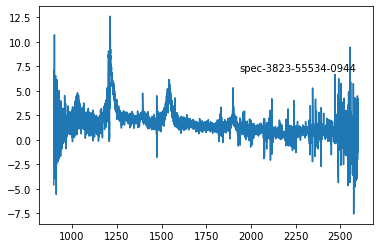

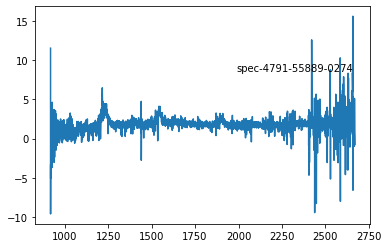

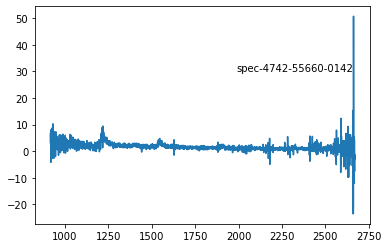

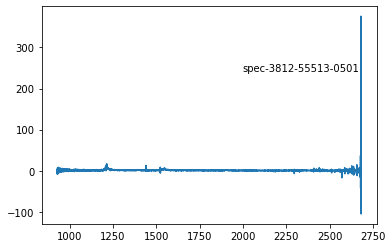

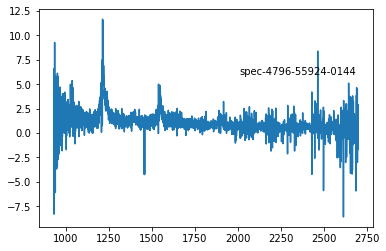

...

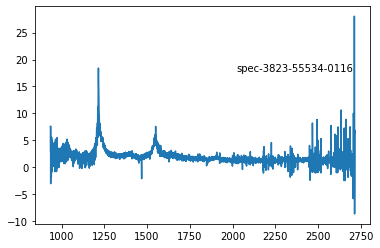

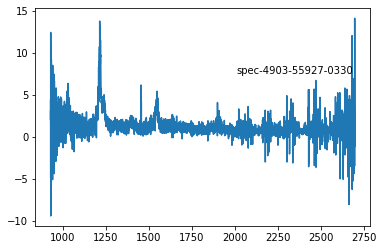

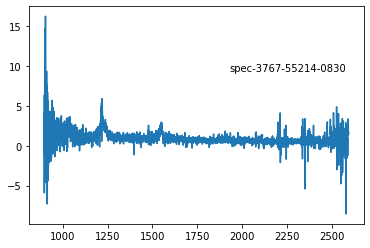

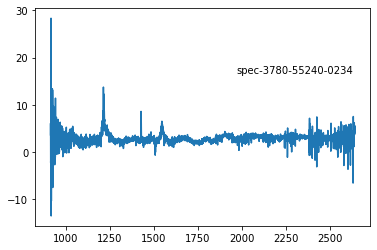

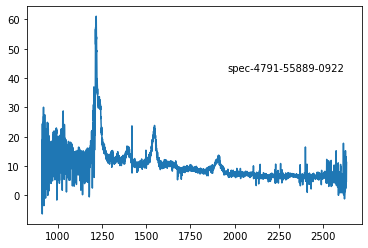

In [17]:
for i in np.where((redshifts>=2.8) & (redshifts<3))[0]:
    fig,ax = plt.subplots(1,1)
    ax.plot(rest_lam_tot[i], flux_tot[i])
    ax.text(0.6, 0.7, names[i], transform = ax.transAxes)
    plt.show()
    plt.close(fig)

Plotting all the spectra on the same plot for any desired redshift bin:

28


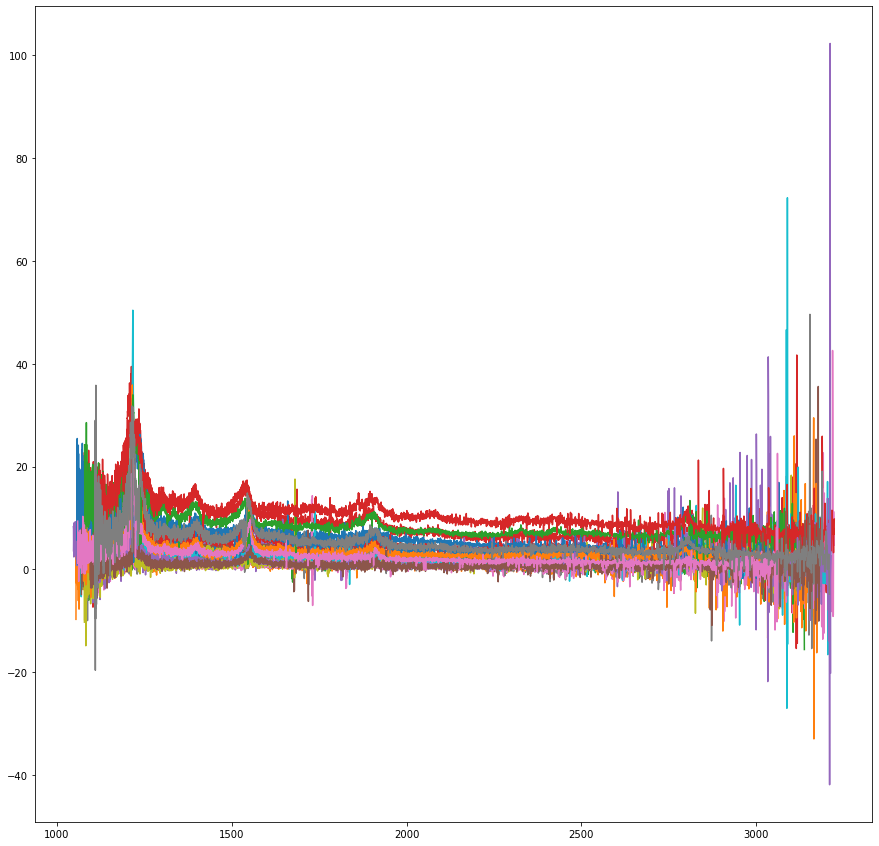

In [12]:
plt.figure(figsize=(15,15))
for i in np.linspace(2.2,2.2,1):
    index = [b for b,x in enumerate(redshifts) if i <= x < i+0.2]
    index = [b for b in index if n_hs[b]>22]
    for t in index:
        plt.plot(rest_lam_tot[t], flux_tot[t], lw=1.5)
print(len(index))

Retrieving all data of average spectra from matched analysis notebook:

In [73]:
with open('average_spectra_info.pkl', 'rb') as file:
    inf = pickle.load(file)

In [72]:
indexs1_unobscured = inf['indexs1_unobscured']
final_wavelengths1_unobscured = inf['final_wavelengths1_unobscured']
final_fluxs1_unobscured = inf['final_fluxs1_unobscured']
final_stddevs1_unobscured = inf['final_stddevs1_unobscured']
text1_unobscured = inf['text1_unobscured']
indexs1_obscured = inf['indexs1_obscured']
final_wavelengths1_obscured = inf['final_wavelengths1_obscured']
final_fluxs1_obscured = inf['final_fluxs1_obscured']
final_stddevs1_obscured = inf['final_stddevs1_obscured']
text1_obscured = inf['text1_obscured']

indexs2_unobscured = inf['indexs2_unobscured']
final_wavelengths2_unobscured = inf['final_wavelengths2_unobscured']
final_fluxs2_unobscured = inf['final_fluxs2_unobscured']
final_uncertainties2_unobscured = inf['final_uncertainties2_unobscured']
text2_unobscured = inf['text2_unobscured']
indexs2_obscured = inf['indexs2_obscured']
final_wavelengths2_obscured = inf['final_wavelengths_2_obscured']
final_fluxs2_obscured = inf['final_fluxs2_obscured']
final_uncertainties2_obscured = inf['final_uncertainties2_obscured']
text2_obscured = inf['text2_obscured']

indexs3_unobscured = inf['indexs3_unobscured']
final_wavelengths3_unobscured = inf['final_wavelengths3_unobscured']
final_fluxs3_unobscured = inf['final_fluxs3_unobscured']
final_uncertainties3_unobscured = inf['final_uncertainties3_unobscured']
text3_unobscured = inf['text3_unobscured']
indexs3_obscured = inf['indexs3_obscured']
final_wavelengths3_obscured = inf['final_wavelengths_3_obscured']
final_fluxs3_obscured = inf['final_fluxs3_obscured']
final_uncertainties3_obscured = inf['final_uncertainties3_obscured']
text3_obscured = inf['text3_obscured']

indexs_sim_unobscured = inf['indexs_sim_unobscured']
final_wavelengths_sim_unobscured = inf['final_wavelengths_sim_unobscured']
final_fluxs_sim_unobscured = inf['final_fluxs_sim_unobscured']
final_stddevs_sim_unobscured = inf['final_stddevs_sim_unobscured']
text_sim_unobscured = inf['text_sim_unobscured']
indexs_sim_obscured = inf['indexs_sim_obscured']
final_wavelengths_sim_obscured = inf['final_wavelengths_sim_obscured']
final_fluxs_sim_obscured = inf['final_fluxs_sim_obscured']
final_stddevs_sim_obscured = inf['final_stddevs_sim_obscured']
text_sim_obscured = inf['text_sim_obscured']

indexs_wei_unobscured = inf['indexs_wei_unobscured']
final_wavelengths_wei_unobscured = inf['final_wavelengths_wei_unobscured']
final_fluxs_wei_unobscured = inf['final_fluxs_wei_unobscured']
final_stddevs_wei_unobscured = inf['final_stddevs_wei_unobscured']
text_wei_unobscured = inf['text_wei_unobscured']
indexs_wei_obscured = inf['indexs_wei_obscured']
final_wavelengths_wei_obscured = inf['final_wavelengths_wei_obscured']
final_fluxs_wei_obscured = inf['final_fluxs_wei_obscured']
final_stddevs_wei_obscured = inf['final_stddevs_wei_obscured']
text_wei_obscured = inf['text_wei_obscured']

indexs_med_unobscured = inf['indexs_med_unobscured']
final_wavelengths_med_unobscured = inf['final_wavelengths_med_unobscured']
final_fluxs_med_unobscured = inf['final_fluxs_med_unobscured']
final_stddevs_med_unobscured = inf['final_stddevs_med_unobscured']
text_med_unobscured = inf['text_med_unobscured']
indexs_med_obscured = inf['indexs_med_obscured']
final_wavelengths_med_obscured = inf['final_wavelengths_med_obscured']
final_fluxs_med_obscured = inf['final_fluxs_med_obscured']
final_stddevs_med_obscured = inf['final_stddevs_med_obscured']
text_med_obscured = inf['text_med_obscured']

indexs_simnorm_unobscured = inf['indexs_simnorm_unobscured']
final_wavelengths_simnorm_unobscured = inf['final_wavelengths_simnorm_unobscured']
final_fluxs_simnorm_unobscured = inf['final_fluxs_simnorm_unobscured']
final_stddevs_simnorm_unobscured = inf['final_stddevs_simnorm_unobscured']
text_simnorm_unobscured = inf['text_simnorm_unobscured']
indexs_simnorm_obscured = inf['indexs_simnorm_obscured']
final_wavelengths_simnorm_obscured = inf['final_wavelengths_simnorm_obscured']
final_fluxs_simnorm_obscured = inf['final_fluxs_simnorm_obscured']
final_stddevs_simnorm_obscured = inf['final_stddevs_simnorm_obscured']
text_simnorm_obscured = inf['text_simnorm_obscured']

indexs_weinorm_unobscured = inf['indexs_weinorm_unobscured']
final_wavelengths_weinorm_unobscured = inf['final_wavelengths_weinorm_unobscured']
final_fluxs_weinorm_unobscured = inf['final_fluxs_weinorm_unobscured']
final_stddevs_weinorm_unobscured = inf['final_stddevs_weinorm_unobscured']
text_weinorm_unobscured = inf['text_weinorm_unobscured']
indexs_weinorm_obscured = inf['indexs_weinorm_obscured']
final_wavelengths_weinorm_obscured = inf['final_wavelengths_weinorm_obscured']
final_fluxs_weinorm_obscured = inf['final_fluxs_weinorm_obscured']
final_stddevs_weinorm_obscured = inf['final_stddevs_weinorm_obscured']
text_weinorm_obscured = inf['text_weinorm_obscured']

indexs_weinorm_1 = inf['indexs_weinorm_1']
final_wavelengths_weinorm_1 = inf['final_wavelengths_weinorm_1']
final_fluxs_weinorm_1 = inf['final_fluxs_weinorm_1']
final_stddevs_weinorm_1 = inf['final_stddevs_weinorm_1']
text_weinorm_1 = inf['text_weinorm_1']

indexs_weinorm_2 = inf['indexs_weinorm_2']
final_wavelengths_weinorm_2 = inf['final_wavelengths_weinorm_2']
final_fluxs_weinorm_2 = inf['final_fluxs_weinorm_2']
final_stddevs_weinorm_2 = inf['final_stddevs_weinorm_2']
text_weinorm_2 = inf['text_weinorm_2']

indexs_weinorm_3 = inf['indexs_weinorm_3']
final_wavelengths_weinorm_3 = inf['final_wavelengths_weinorm_3']
final_fluxs_weinorm_3 = inf['final_fluxs_weinorm_3']
final_stddevs_weinorm_3 = inf['final_stddevs_weinorm_3']
text_weinorm_3 = inf['text_weinorm_3']

indexs_weiwide_unobscured = inf['indexs_weiwide_unobscured']
final_wavelengths_weiwide_unobscured = inf['final_wavelengths_weiwide_unobscured']
final_fluxs_weiwide_unobscured = inf['final_fluxs_weiwide_unobscured']
final_stddevs_weiwide_unobscured = inf['final_stddevs_weiwide_unobscured']
text_weiwide_unobscured = inf['text_weiwide_unobscured']
indexs_weiwide_obscured = inf['indexs_weiwide_obscured']
final_wavelengths_weiwide_obscured = inf['final_wavelengths_weiwide_obscured']
final_fluxs_weiwide_obscured = inf['final_fluxs_weiwide_obscured']
final_stddevs_weiwide_obscured = inf['final_stddevs_weiwide_obscured']
text_weiwide_obscured = inf['text_weiwide_obscured']

Plotting the wavelength cut-off spectra including obscured and unobscured for each method:

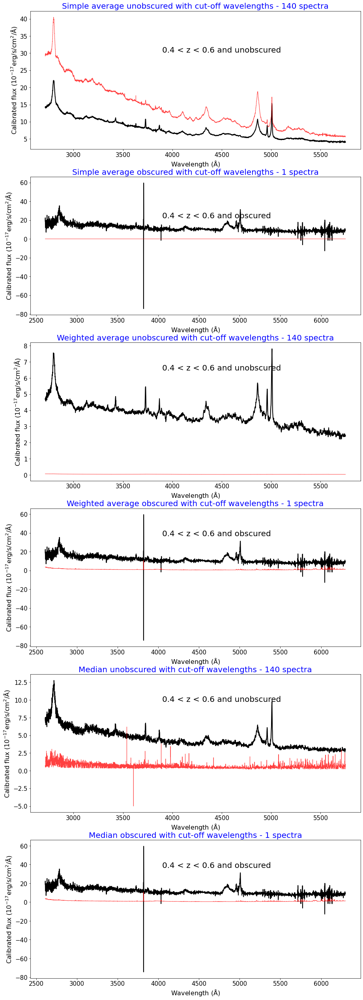

In [15]:
i = 2
fig, axes = plt.subplots(6, 1, figsize=(15,45))
ax = axes[0]
ax.set_title(f'Simple average unobscured with cut-off wavelengths - {len(indexs1_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths1_unobscured[i], final_fluxs1_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths1_unobscured[i], final_stddevs1_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text1_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1]
ax.set_title(f'Simple average obscured with cut-off wavelengths - {len(indexs1_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths1_obscured[i], final_fluxs1_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths1_obscured[i], final_stddevs1_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text1_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[2]
ax.set_title(f'Weighted average unobscured with cut-off wavelengths - {len(indexs2_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths2_unobscured[i], final_fluxs2_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths2_unobscured[i], final_uncertainties2_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text2_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[3]
ax.set_title(f'Weighted average obscured with cut-off wavelengths - {len(indexs2_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths2_obscured[i], final_fluxs2_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths2_obscured[i], final_uncertainties2_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text2_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[4]
ax.set_title(f'Median unobscured with cut-off wavelengths - {len(indexs3_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths3_unobscured[i], final_fluxs3_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths3_unobscured[i], final_uncertainties3_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text3_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[5]
ax.set_title(f'Median obscured with cut-off wavelengths - {len(indexs3_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths3_obscured[i], final_fluxs3_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths3_obscured[i], final_uncertainties3_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text3_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)

Plotting the full wavelength spectra:

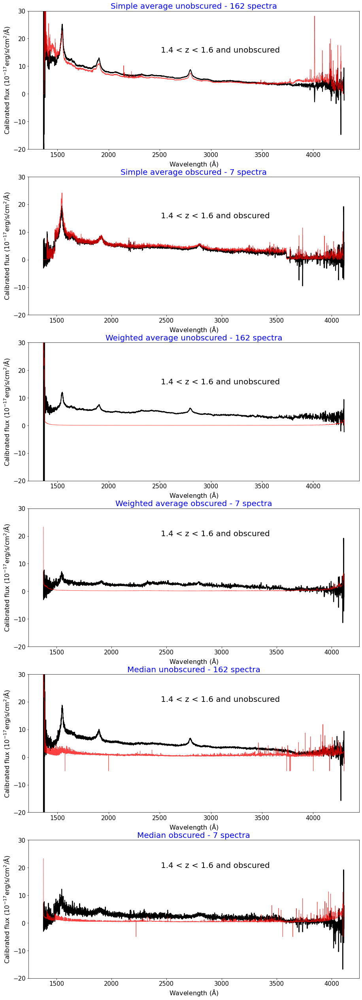

In [16]:
i = 7
fig, axes = plt.subplots(6, 1, figsize=(15,45))
for ax in axes:
    ax.set_ylim(-20, 30)
ax = axes[0]
ax.set_title(f'Simple average unobscured - {len(indexs_sim_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_sim_unobscured[i], final_fluxs_sim_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_sim_unobscured[i], final_stddevs_sim_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_sim_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1]
ax.set_title(f'Simple average obscured - {len(indexs_sim_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_sim_obscured[i], final_fluxs_sim_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_sim_obscured[i], final_stddevs_sim_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_sim_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[2]
ax.set_title(f'Weighted average unobscured - {len(indexs_wei_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_wei_unobscured[i], final_fluxs_wei_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_wei_unobscured[i], final_stddevs_wei_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_wei_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[3]
ax.set_title(f'Weighted average obscured - {len(indexs_wei_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_wei_obscured[i], final_fluxs_wei_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_wei_obscured[i], final_stddevs_wei_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text_wei_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[4]
ax.set_title(f'Median unobscured - {len(indexs_med_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_med_unobscured[i], final_fluxs_med_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_med_unobscured[i], final_stddevs_med_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text_med_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[5]
ax.set_title(f'Median obscured - {len(indexs_med_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_med_obscured[i], final_fluxs_med_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_med_obscured[i], final_stddevs_med_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text_med_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)

Plotting the cut off methods and the total wavelength range methods on the same figure:

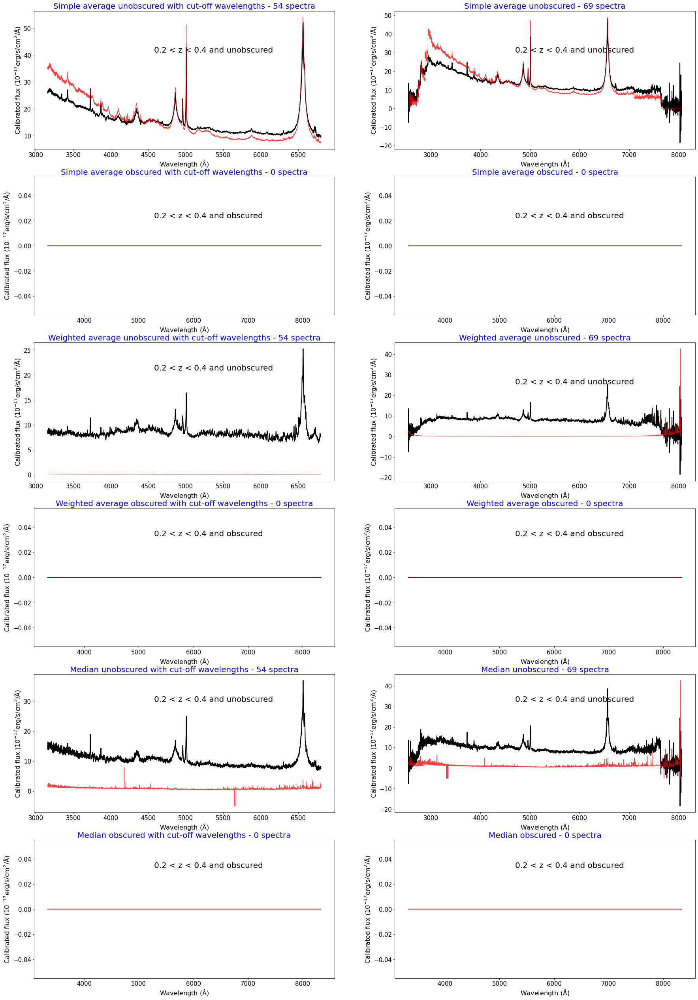

In [17]:
i = 1
fig, axes = plt.subplots(6, 2, figsize=(30,45))
ax = axes[0,0]
ax.set_title(f'Simple average unobscured with cut-off wavelengths - {len(indexs1_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths1_unobscured[i], final_fluxs1_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths1_unobscured[i], final_stddevs1_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text1_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1,0]
ax.set_title(f'Simple average obscured with cut-off wavelengths - {len(indexs1_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths1_obscured[i], final_fluxs1_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths1_obscured[i], final_stddevs1_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text1_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[2,0]
ax.set_title(f'Weighted average unobscured with cut-off wavelengths - {len(indexs2_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths2_unobscured[i], final_fluxs2_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths2_unobscured[i], final_uncertainties2_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text2_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[3,0]
ax.set_title(f'Weighted average obscured with cut-off wavelengths - {len(indexs2_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths2_obscured[i], final_fluxs2_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths2_obscured[i], final_uncertainties2_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text2_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[4,0]
ax.set_title(f'Median unobscured with cut-off wavelengths - {len(indexs3_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths3_unobscured[i], final_fluxs3_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths3_unobscured[i], final_uncertainties3_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text3_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[5,0]
ax.set_title(f'Median obscured with cut-off wavelengths - {len(indexs3_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths3_obscured[i], final_fluxs3_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths3_obscured[i], final_uncertainties3_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text3_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[0,1]
ax.set_title(f'Simple average unobscured - {len(indexs_sim_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_sim_unobscured[i], final_fluxs_sim_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_sim_unobscured[i], final_stddevs_sim_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_sim_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1,1]
ax.set_title(f'Simple average obscured - {len(indexs_sim_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_sim_obscured[i], final_fluxs_sim_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_sim_obscured[i], final_stddevs_sim_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_sim_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[2,1]
ax.set_title(f'Weighted average unobscured - {len(indexs_wei_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_wei_unobscured[i], final_fluxs_wei_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_wei_unobscured[i], final_stddevs_wei_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_wei_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[3,1]
ax.set_title(f'Weighted average obscured - {len(indexs_wei_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_wei_obscured[i], final_fluxs_wei_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_wei_obscured[i], final_stddevs_wei_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text_wei_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[4,1]
ax.set_title(f'Median unobscured - {len(indexs_med_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_med_unobscured[i], final_fluxs_med_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_med_unobscured[i], final_stddevs_med_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text_med_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[5,1]
ax.set_title(f'Median obscured - {len(indexs_med_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_med_obscured[i], final_fluxs_med_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_med_obscured[i], final_stddevs_med_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.8, text_med_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)



Plotting weighted average spectra for original and normalised:

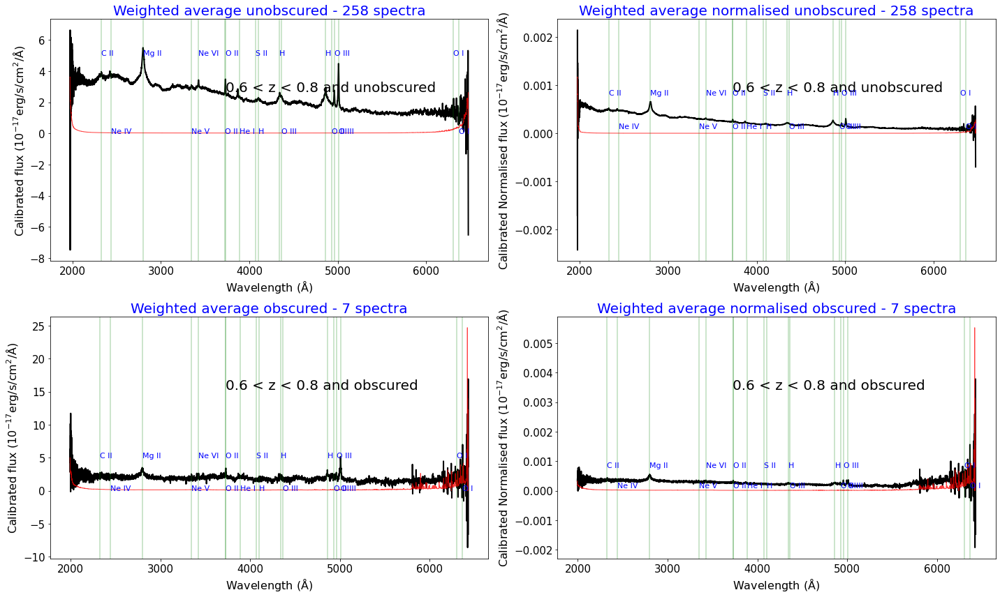

In [25]:
i = 3
fig, axes = plt.subplots(2,2, figsize=(20,12))
ax = axes[0,0]
ax.set_title(f'Weighted average unobscured - {len(indexs_wei_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_wei_unobscured[i], final_fluxs_wei_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_wei_unobscured[i], final_stddevs_wei_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_wei_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[0,1]
ax.set_title(f'Weighted average normalised unobscured - {len(indexs_weinorm_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_unobscured[i], final_fluxs_weinorm_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_unobscured[i], final_stddevs_weinorm_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_weinorm_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1,0]
ax.set_title(f'Weighted average obscured - {len(indexs_wei_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_wei_obscured[i], final_fluxs_wei_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_wei_obscured[i], final_stddevs_wei_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_wei_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1,1]
ax.set_title(f'Weighted average normalised obscured - {len(indexs_weinorm_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_obscured[i], final_fluxs_weinorm_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_obscured[i], final_stddevs_weinorm_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.4, 0.7, text_weinorm_obscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
plt.tight_layout()

r=0
for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= final_wavelengths_wei_obscured[i][0]) & (em_line_wavelength[s] <= final_wavelengths_wei_obscured[i][-1]):
        r+=1
        for ax in axes[:, 0]:  
            ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
            if r%2==0:
                ax.text(em_line_wavelength[s], 0, em_line_type[s], color='blue', fontsize=11)
            else:
                ax.text(em_line_wavelength[s], 5, em_line_type[s], color='blue', fontsize=11)
                
        for ax in axes[:, 1]:  
            ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
            if r%2==0:
                ax.text(em_line_wavelength[s], 0.0001, em_line_type[s], color='blue', fontsize=11)
            else:
                ax.text(em_line_wavelength[s], 0.0008, em_line_type[s], color='blue', fontsize=11)

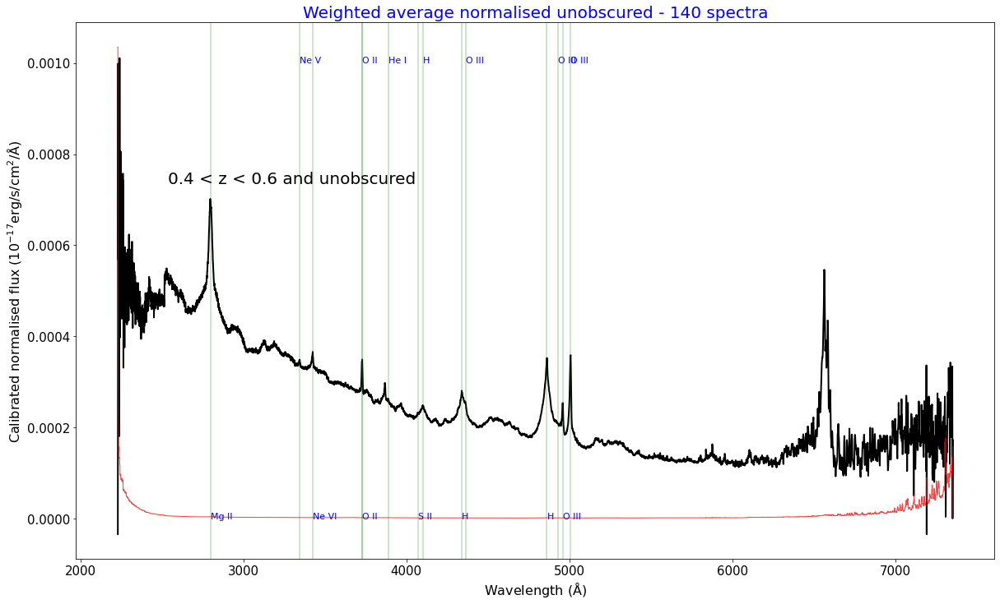

In [19]:
i = 2
fig, ax = plt.subplots(1,1, figsize=(20,12))
ax.set_title(f'Weighted average normalised unobscured - {len(indexs_weinorm_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_unobscured[i], final_fluxs_weinorm_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_unobscured[i], final_stddevs_weinorm_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.1, 0.7, text_weinorm_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)

r=0
for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= final_wavelengths_wei_obscured[i][0]) & (em_line_wavelength[s] <= final_wavelengths_wei_obscured[i][-1]):
        r+=1  
        ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
        if r%2==0:
            ax.text(em_line_wavelength[s], 0.001, em_line_type[s], color='blue', fontsize=11)
        else:
            ax.text(em_line_wavelength[s], 0.00, em_line_type[s], color='blue', fontsize=11)

Plotting the weighted normalised spectra with equally populated n_h bins:

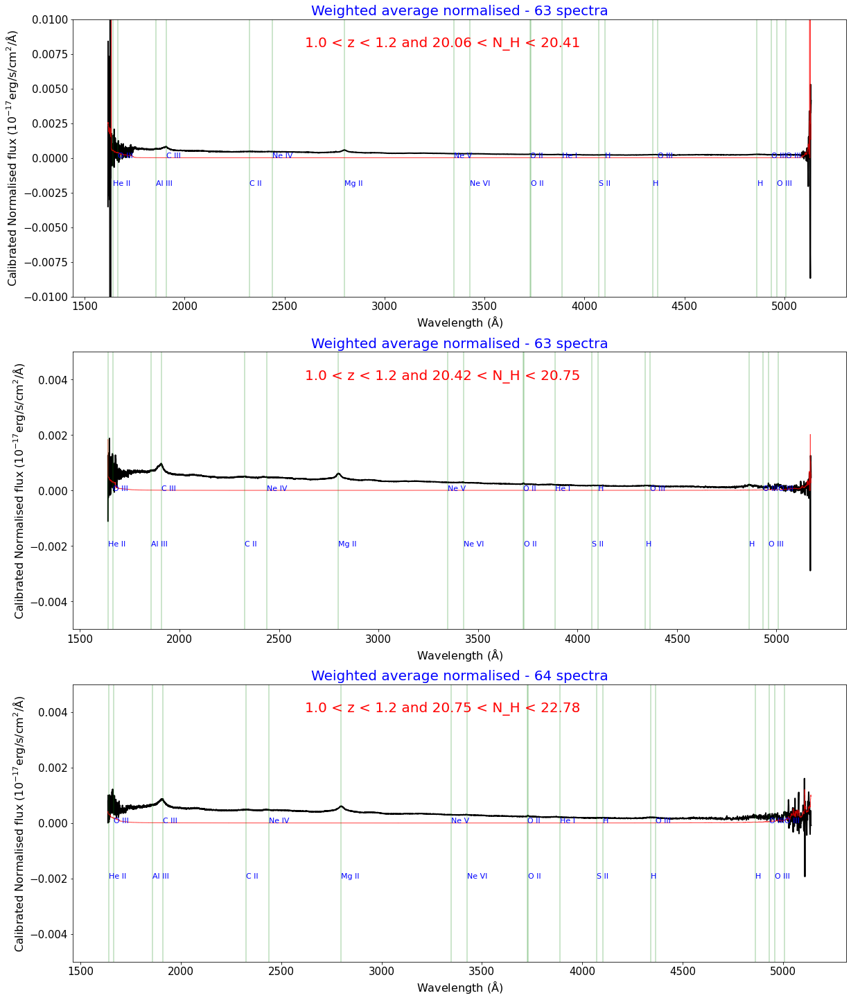

In [101]:
i = 5
fig, axes = plt.subplots(3, 1, figsize = (20,25))
ax = axes[0]
ax.set_title(f'Weighted average normalised - {len(indexs_weinorm_1[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_1[i], final_fluxs_weinorm_1[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_1[i], final_stddevs_weinorm_1[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.3, 0.9, text_weinorm_1[i], transform = ax.transAxes, fontsize=20, color = 'red')
ax.set_ylim(-0.01,0.01)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax = axes[1]
ax.set_title(f'Weighted average normalised - {len(indexs_weinorm_2[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_2[i], final_fluxs_weinorm_2[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_2[i], final_stddevs_weinorm_2[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.3, 0.9, text_weinorm_2[i], transform = ax.transAxes, fontsize=20, color = 'red')
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax.set_ylim(-0.005,0.005)
ax = axes[2]
ax.set_title(f'Weighted average normalised - {len(indexs_weinorm_3[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_3[i], final_fluxs_weinorm_3[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_3[i], final_stddevs_weinorm_3[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.3, 0.9, text_weinorm_3[i], transform = ax.transAxes, fontsize=20, color = 'red')
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax.set_ylim(-0.005,0.005)

r=0
for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= final_wavelengths_weinorm_1[i][0]) & (em_line_wavelength[s] <= final_wavelengths_weinorm_1[i][-1]):
        r+=1
        for ax in axes:
            ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
            if r%2==0:
                ax.text(em_line_wavelength[s], 0.000, em_line_type[s], color='blue', fontsize=11)
            else:
                ax.text(em_line_wavelength[s], -0.002, em_line_type[s], color='blue', fontsize=11)

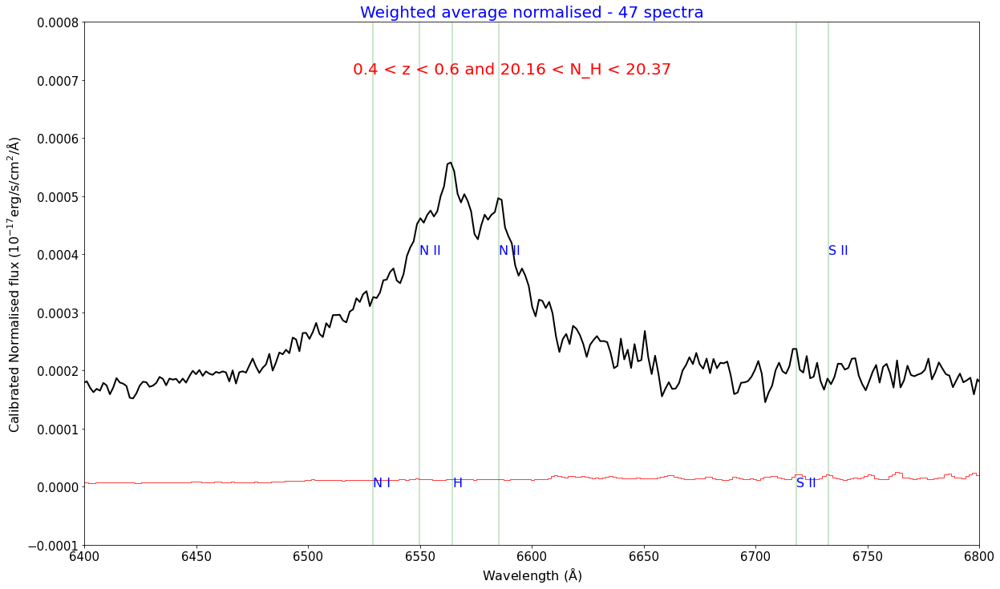

In [24]:
i =2
fig, ax = plt.subplots(1, 1, figsize=(20,12))
ax.set_title(f'Weighted average normalised - {len(indexs_weinorm_2[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weinorm_2[i], final_fluxs_weinorm_2[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_2[i], final_stddevs_weinorm_2[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.3, 0.9, text_weinorm_2[i], transform = ax.transAxes, fontsize=20, color = 'red')
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax.set_xlim(6400, 6800)
ax.set_ylim(-0.0001, 0.0008)

r=0
for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= 6400) & (em_line_wavelength[s] <= 6800):
        r+=1
        ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
        if r%2==0:
            ax.text(em_line_wavelength[s], 0.0004, em_line_type[s], color='blue', fontsize=16)
        else:
            ax.text(em_line_wavelength[s], -0.00, em_line_type[s], color='blue', fontsize=16)

Plotting wide redshift bins spectra:

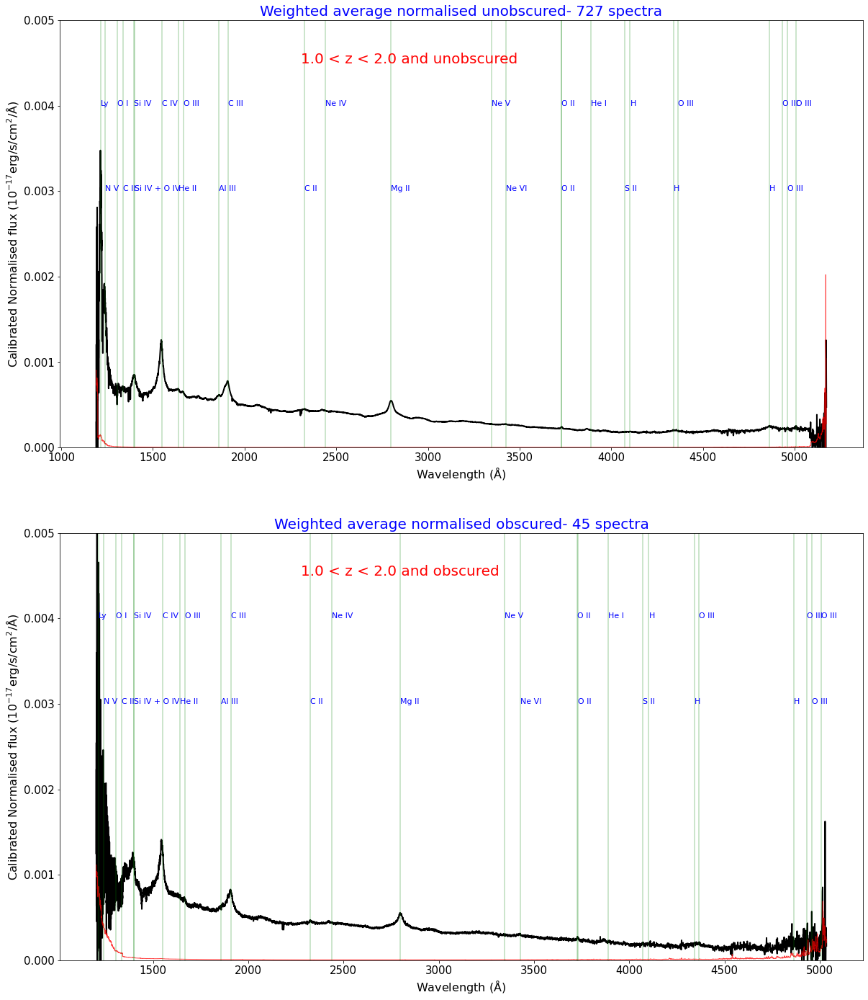

In [105]:
i = 1
fig, axes = plt.subplots(2,1, figsize=(20,24))
ax = axes[0]
ax.set_title(f'Weighted average normalised unobscured- {len(indexs_weiwide_unobscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weiwide_unobscured[i], final_fluxs_weiwide_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_weiwide_unobscured[i], final_stddevs_weiwide_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.3, 0.9, text_weiwide_unobscured[i], transform = ax.transAxes, fontsize=20, color = 'red')
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)

r=0
for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= final_wavelengths_weiwide_unobscured[i][0]) & (em_line_wavelength[s] <= final_wavelengths_weiwide_unobscured[i][-1]):
        r+=1
        ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
        if r%2==0:
            ax.text(em_line_wavelength[s], 0.003, em_line_type[s], color='blue', fontsize=11)
        else:
            ax.text(em_line_wavelength[s], 0.004, em_line_type[s], color='blue', fontsize=11)

ax = axes[1]
ax.set_title(f'Weighted average normalised obscured- {len(indexs_weiwide_obscured[i])} spectra', color='blue', fontsize=20)
ax.plot(final_wavelengths_weiwide_obscured[i], final_fluxs_weiwide_obscured[i], color='black', lw=2)
ax.plot(final_wavelengths_weiwide_obscured[i], final_stddevs_weiwide_obscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.3, 0.9, text_weiwide_obscured[i], transform = ax.transAxes, fontsize=20, color = 'red')
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated Normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)

r=0
for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= final_wavelengths_weiwide_obscured[i][0]) & (em_line_wavelength[s] <= final_wavelengths_weiwide_obscured[i][-1]):
        r+=1
        ax.axvline(em_line_wavelength[s], color='green', lw=0.4)
        if r%2==0:
            ax.text(em_line_wavelength[s], 0.003, em_line_type[s], color='blue', fontsize=11)
        else:
            ax.text(em_line_wavelength[s], 0.004, em_line_type[s], color='blue', fontsize=11)

for ax in axes:
    ax.set_ylim(0, 0.005)

    

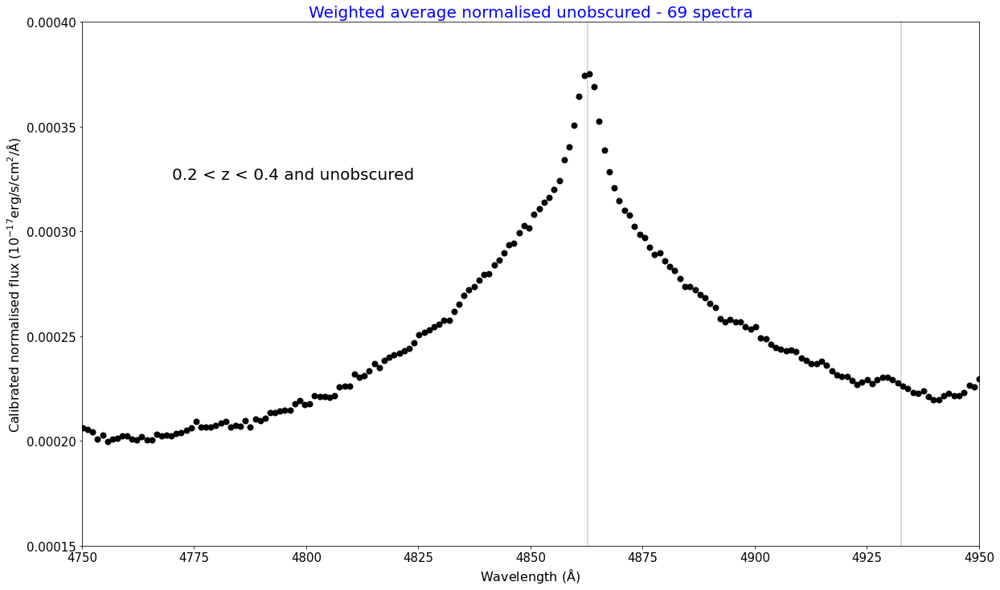

In [727]:
i = 1
fig, ax = plt.subplots(1,1, figsize=(20,12))
ax.set_title(f'Weighted average normalised unobscured - {len(indexs_weinorm_unobscured[i])} spectra', color='blue', fontsize=20)
ax.scatter(final_wavelengths_weinorm_unobscured[i], final_fluxs_weinorm_unobscured[i], color='black', lw=2)
ax.plot(final_wavelengths_weinorm_unobscured[i], final_stddevs_weinorm_unobscured[i], marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.1, 0.7, text_weinorm_unobscured[i], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax.set_xlim(4750,4950)
ax.set_ylim(0.00015, 0.0004)

for s in range(len(em_line_wavelength)):
    if (em_line_wavelength[s] >= final_wavelengths_wei_obscured[1][0]) & (em_line_wavelength[s] <= final_wavelengths_wei_obscured[1][-1]):
        ax.axvline(em_line_wavelength[s], color='green', lw=0.4)

In [217]:
waves = final_wavelengths_weinorm_unobscured[1][(final_wavelengths_weinorm_unobscured[1]>4750) & (final_wavelengths_weinorm_unobscured[1]<4950)]
fluxess = final_fluxs_weinorm_unobscured[1][(final_wavelengths_weinorm_unobscured[1]>4750) & (final_wavelengths_weinorm_unobscured[1]<4950)]
errs = final_stddevs_weinorm_unobscured[1][(final_wavelengths_weinorm_unobscured[1]>4750) & (final_wavelengths_weinorm_unobscured[1]<4950)]

In [218]:
def Lorentzian(x, a, b, c, d): #FWHM = d
    return (a/np.pi) * (d/2)/((x-c)**2 + (d/2)**2) + b

def Gaussian(x, a, b, c, d): #FWHM = 2*root(2*ln2)*d
    return a * np.exp(-(x-c)**2/(2*d**2)) + b

def Laplacian(x, a, b, c, d): #FWHM = 2*d*ln2
    return a * np.exp(-np.abs(x-c)/d) + b

In [219]:
popt_lor, pcov_lor = curve_fit(Lorentzian, waves ,fluxess, p0=(12,14,4865,3.5))
fit_lor = Lorentzian(waves, *popt_lor)
popt_gauss, pcov_gauss = curve_fit(Gaussian, waves, fluxess, p0=(12,14,4865,4))
fit_gauss = Gaussian(waves, *popt_gauss)
popt_lap, pcov_lap = curve_fit(Laplacian, waves ,fluxess, p0=(12,14,4865,3.5))
fit_lap = Laplacian(waves, *popt_lap)

(0.00015, 0.0004)

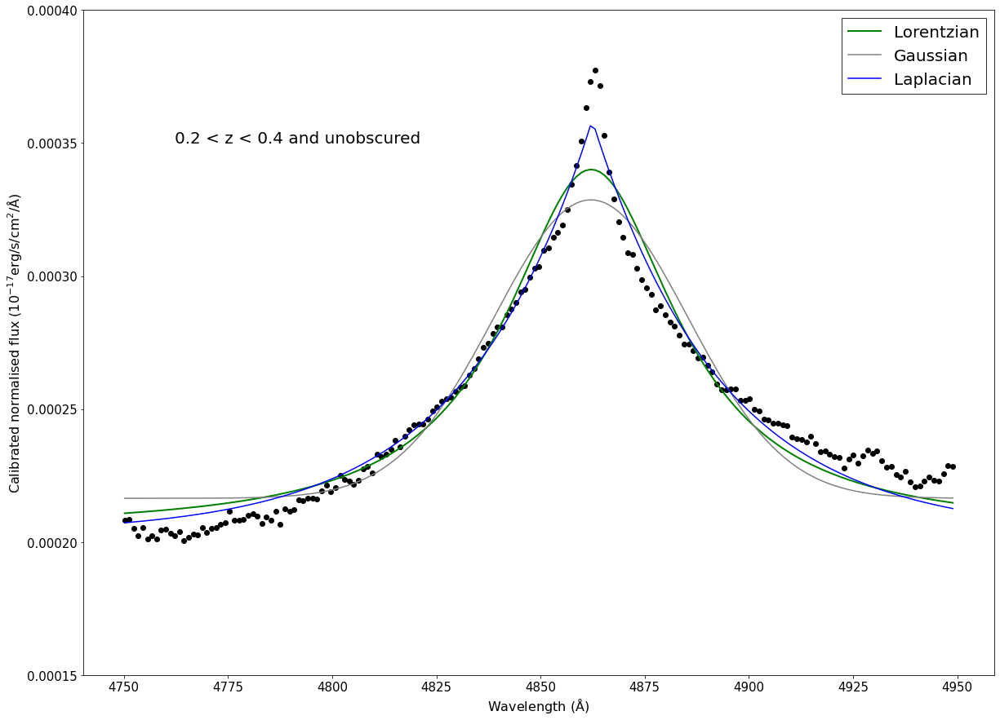

In [224]:
fig, ax = plt.subplots(1, 1, figsize=(20,15))
ax.scatter(waves, fluxess, color='black')
ax.plot(waves, errs, marker='None', linestyle='-', color='red', drawstyle='steps-mid', alpha=0.75, linewidth=1)
ax.text(0.1, 0.8, text_weinorm_unobscured[1], transform = ax.transAxes, fontsize=20)
ax.set_xlabel('Wavelength ($\mathrm{\u212b}$)', fontsize=16)
ax.set_ylabel('Calibrated normalised flux ($\mathrm{10^{-17}}$erg/s/$\mathrm{cm^2}$/$\mathrm{\u212b}$)', fontsize=16)
ax.tick_params(axis='both', labelsize=15)
ax.plot(waves, fit_lor, color='green', lw=2, label = 'Lorentzian')
ax.plot(waves, fit_gauss, color='grey', label = 'Gaussian')
ax.plot(waves, fit_lap, color = 'blue', label = 'Laplacian')
ax.legend(loc='best', fontsize=20, fancybox=False, edgecolor='black')
ax.set_ylim(0.00015, 0.0004)

Creatint chi-squared function:

In [203]:
def chi_squared(y, error, ymodel, popt):
    return np.sum((y-ymodel)**2/error**2)/(len(y)- len(popt))